Manual data cleaning:
- deleted the right part in the table that seemed to associate laws to different types
- converted formulas to their values (via Daten -> Berchnen -> Formel in Wert umwandeln)
- removed third row that appeared to only contain sums of certain columns
- removed second and third columns that appeared to only be repeated id columns
- cleaned dates: some had newlines, several were in US style, some were swapped with neighboring column, one in l. 101 is missing, some have the correct cell type while others don't, some had typos. Converted all cells to dates using https://www.reddit.com/r/libreoffice/comments/saqks1/how_to_convert_text_string_to_date/  but with "\\$0" instead of "\\$1".
- merged the top two rows containing column names
- removed not needed columns

still todo:
- remove more columns
- merge one-hot-encoded US states? -> no, there are rows with more than one state assigned
- states that don't have any "True" value: Hawaii, Maina, Nevada, North Carolina, West Virginia

try lasso logistic regression?

install skrub, openpyxl, jupyter
and (new version): pytabkit

In [53]:
filename = 'data/10_with_vandv.xlsx'
import pandas as pd
df = pd.read_excel(filename)
columns = list(df.columns)
columns_not_richter = [columns[i] for i in range(len(columns)) if i < columns.index('Story') or i > columns.index('keine Richter')]
print(f'{columns_not_richter=}')
df = df[columns_not_richter]

columns_not_richter=['ID', 'Name', 'Fallnummer', 'Datum der Entscheidung', 'Teil des Urteils', 'Bereich', 'Seite', 'Scope', 'poH', 'H', 'Nebraska', 'New York', 'Connecticut', 'Illinois', 'Pennsylvania', 'Virginia', 'Ohio', 'Maryland', 'Washington', 'Kansas', 'Kentucky', 'Colorado', 'Iowa', 'Alabama', 'Mississippi', 'Missouri', 'Rhode Island', 'Delaware', 'Georgia', 'Minnesota', 'New Jersey', 'Oklahoma', 'South Carolina', 'Texas', 'Alaska', 'Arizona', 'Arkansas', 'Florida', 'Indiana', 'Louisiana', 'Massachusetts', 'Michigan', 'New Hampshire', 'North Dakota', 'Tennessee', 'Wyoming', 'California', 'Idaho', 'Montana', 'New Mexico', 'Oregon', 'South Dakota', 'Utah', 'Vermont', 'Wisconsin', 'Hawaii', 'Maine', 'Nevada', 'North Carolina', 'West Virginia', 'Public Good', 'General Welfare', 'Good government', 'Frieden', 'Commerce Clause und Ard. I, Section 8 U. S. Const.', 'Art. I, Section 8, Clause 1 U.S. Const.', 'Art. I, Section 9 U.S. Const. und bill of attainder', 'Art. I, Section 10 U. S. 

In [2]:
from skrub import TableReport

In [3]:
report = TableReport(df)
report

Processing column 173 / 173


<TableReport: use .open() to display>

In [4]:
col_names = list(df.columns)
state_names = [col_name for i, col_name in enumerate(col_names) if col_names.index('Nebraska') <= i <= col_names.index('West Virginia')]

In [5]:
sum([df[state_name].astype(int) for state_name in state_names]).argmax()

33

In [6]:
[state_name for state_name in state_names if df[state_name][33]]

['Pennsylvania', 'Virginia', 'Ohio', 'Maryland']

In [55]:
df_prep = df.drop(columns=['ID', 'Name', 'Fallnummer', 'Bereich', 'Scope'])

# don't use this
def merge_or(group):
    # Identify boolean and integer columns
    bool_int_cols = group.select_dtypes(include=['bool', 'int']).columns

    # Apply logical OR for those columns
    merged = group[bool_int_cols].any()

    # Ensure that all other columns (non-boolean/int) are identical
    other_cols = group.select_dtypes(exclude=['bool', 'int']).columns
    for col in other_cols:
        if not group[col].nunique() == 1:
            raise ValueError(f"Non-boolean/int column '{col}' has inconsistent values for date {group['Datum der Entscheidung'].iloc[0]}")

    # Copy the first value of the non-boolean/int columns (since they're identical)
    for col in other_cols:
        merged[col] = group[col].iloc[0]

    return merged

def group_dates(df):
    # Group by date and apply the merge function
    return df.groupby('Datum der Entscheidung').apply(merge_or).reset_index()

# df_prep_old = df_prep
# df_prep = group_dates(df_prep)

report = TableReport(df_prep)
report

Processing column 139 / 139


<TableReport: use .open() to display>

In [36]:
TableReport(df[df['poH'] == 1][['Teil des Urteils']])

Processing column   1 / 1


<TableReport: use .open() to display>

In [37]:
TableReport(df[df['H'] == 1][['Teil des Urteils']])

Processing column   1 / 1


<TableReport: use .open() to display>

In [8]:
df_prep_2 = df_prep.drop(columns=['Verfassungswidrigkeit und Verfassungsgemäß'])
df_prep_2['keine Richter'] = df_prep_2['keine Richter'].fillna(0.0).astype(bool)

In [9]:
from typing import List

def one_hot_encode(df: pd.DataFrame, col_names: List[str]) -> pd.DataFrame:
    df = df.copy()
    for col_name in col_names:
        for value in pd.unique(df[col_name]):
            df[f'{col_name} = {value}'] = (df[col_name] == value).astype(int)
        df = df.drop(columns=col_name)
    return df

df_prep_oh = one_hot_encode(df_prep_2, ['Teil des Urteils', 'Seite'])

In [10]:
# print(df_prep['Datum der Entscheidung'].astype(int).astype(float))
def date_to_float(df: pd.DataFrame, col: str) -> pd.DataFrame:
    df = df.copy()
    df[col] = df[col].dt.year + (df[col].dt.dayofyear - 1) / (df[col].dt.is_leap_year.apply(lambda x: 366 if x else 365))
    return df

df_prep_oh = date_to_float(df_prep_oh, 'Datum der Entscheidung')

In [11]:
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt

def plot_permutation_importance_with_uncertainty(X, y, estimator, cv=5, n_repeats=10, random_state=None):
    """
    Fits the estimator in a cross-validated fashion, computes permutation feature importances, 
    averages them, and plots them with uncertainty bars.
    
    Parameters:
    - X: DataFrame or ndarray, shape (n_samples, n_features), feature matrix.
    - y: array-like, shape (n_samples,), target vector.
    - estimator: scikit-learn estimator object, should implement `fit`.
    - cv: int, cross-validation generator (default: 5-fold stratified).
    - n_repeats: int, number of permutation importance repetitions (default: 10).
    - random_state: int, Random seed (default: None).
    
    Returns:
    - A plot of averaged permutation importances with error bars.
    """
    # Create cross-validation object
    cv_splitter = StratifiedKFold(n_splits=cv, shuffle=True, random_state=random_state)
    
    # List to store permutation importance results for each fold
    importances = []
    
    # Loop over cross-validation splits
    for train_idx, test_idx in cv_splitter.split(X, y):
        # Train on training fold
        if isinstance(X, pd.DataFrame):
            X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        else:
            X_train, X_test = X[train_idx], X[test_idx]
        
        y_train, y_test = y[train_idx], y[test_idx]
        estimator.fit(X_train, y_train)
        
        # Compute permutation importance on test fold
        result = permutation_importance(estimator, X_test, y_test, scoring='roc_auc', 
                                        n_repeats=n_repeats, random_state=random_state, n_jobs=-1)
        
        # Store importances for this fold
        importances.append(result.importances_mean)
    
    # Convert to numpy array for easy calculations
    importances = np.array(importances)
    
    # Compute mean and standard deviation across folds
    mean_importances = np.mean(importances, axis=0)
    std_importances = np.std(importances, axis=0)
    
    # Plot feature importances with error bars
    features = X.columns if isinstance(X, pd.DataFrame) else np.arange(X.shape[1])

    print(f'Feature importances:')
    perm = np.argsort(mean_importances)[::-1]
    #for feature, mean_imp, std_imp in zip(features, mean_importances, std_importances):
    #    print(f'{feature}: {mean_imp:g} +- {std_imp:g}'
    for idx in perm:
        print(f'{features[idx]}: {mean_importances[idx]:g} +- {std_importances[idx]:g}')
    
    #plt.figure(figsize=(10, 6))
    #plt.barh(features, mean_importances, xerr=std_importances, align='center')
    #plt.xlabel('Permutation Importance')
    #plt.ylabel('Features')
    #plt.title('Permutation Importance with Uncertainty Bars')
    #plt.gca().invert_yaxis()
    #plt.tight_layout()
    #plt.show()
    

In [12]:
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_validate
import numpy as np

# df_simple = df_prep_oh.drop(columns='Datum der Entscheidung') * 1  # convert bools to int
df_simple = df_prep_oh * 1  # convert bools to int

for target_name in ['H', 'poH']:
    df_y = df_simple[target_name]
    df_x = df_simple.drop(columns=['H', 'poH'])

    clf = RandomForestClassifier()
    # clf = LogisticRegression(penalty='l1', solver='liblinear')
    # clf = LogisticRegression()
    # clf = HistGradientBoostingClassifier()
    print(target_name)
    print(f'Accuracy of constant classifier:', 0.5 + np.abs(np.mean(df_y) - 0.5))
    print('Accuracy of classifier:', np.mean(cross_validate(clf, df_x, df_y, scoring=['accuracy', 'roc_auc'], cv=10)['test_accuracy']))
    print()
    plot_permutation_importance_with_uncertainty(df_x, df_y, clf, cv=5)
    

H
Accuracy of constant classifier: 0.6169590643274854
Accuracy of classifier: 0.7202521008403362

Feature importances:
Datum der Entscheidung: 0.0767285 +- 0.0242464
Seite = Rechtsstaatliche Seite: 0.0268087 +- 0.0134109
Recht auf Sicherheit: 0.0230758 +- 0.0107506
inalienable rights: 0.01299 +- 0.0080088
General Welfare: 0.00994415 +- 0.00673056
Amd. XIV U. S. Const.: 0.00890043 +- 0.00463447
Due Process Clause: 0.00731895 +- 0.00429764
Right to Privacy: 0.00698747 +- 0.00495468
Souveränität und Unabhängigkeit: 0.00657549 +- 0.0135358
New York: 0.00621634 +- 0.00326354
Amd. V U. S. Const.: 0.00592668 +- 0.00172679
Public Good: 0.00441535 +- 0.00364242
Police Power: 0.00440386 +- 0.00837393
Seite = Wirtschaftliche Seite: 0.00386449 +- 0.00632496
Right to Life: 0.0035402 +- 0.0050892
Citizenship: 0.00346331 +- 0.00352623
Virginia: 0.00266476 +- 0.00550722
Richter Washington: 0.00263024 +- 0.00312788
Good government: 0.00248552 +- 0.0016426
Freedom of Association: 0.00201838 +- 0.0025194

In [13]:
# df_simple = df_prep_oh.drop(columns='Datum der Entscheidung') * 1  # convert bools to int
df_simple = df_prep_oh * 1  # convert bools to int
for target_name in ['H', 'poH']:
    df_y = df_simple[target_name]
    # df_x = df_simple[['Recht auf Sicherheit']]
    df_x = df_simple.drop(columns=['H', 'poH'])

    # clf = RandomForestClassifier()
    from pytabkit.models.sklearn.sklearn_interfaces import CatBoost_TD_Classifier
    clf = CatBoost_TD_Classifier(n_cv=5, val_metric_name='1-auc_ovr')
    # clf = LogisticRegression(penalty='l1', solver='liblinear')
    # clf = LogisticRegression()
    # clf = HistGradientBoostingClassifier()
    print(target_name)
    print(f'Accuracy of constant classifier:', 0.5 + np.abs(np.mean(df_y) - 0.5))
    cv_result = cross_validate(clf, df_x, df_y, scoring=['accuracy', 'roc_auc'], cv=10)
    print('Accuracy of classifier:', np.mean(cv_result['test_accuracy']))
    print('ROC AUC of classifier:', np.mean(cv_result['test_roc_auc']))
    print()
    plot_permutation_importance_with_uncertainty(df_x, df_y, clf, cv=5)

H
Accuracy of constant classifier: 0.6169590643274854
Accuracy of classifier: 0.7636974789915966
ROC AUC of classifier: 0.8595142952285808



/media/data/prog/venvs/arne_env/lib/python3.10/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Feature importances:
Datum der Entscheidung: 0.138475 +- 0.0372849
Recht auf Sicherheit: 0.0253689 +- 0.0158681
Seite = Rechtsstaatliche Seite: 0.0219457 +- 0.0127543
inalienable rights: 0.00770821 +- 0.00446424
General Welfare: 0.00750865 +- 0.00574796
Citizenship: 0.00613331 +- 0.00815444
Richter Washington: 0.00564103 +- 0.0100492
Freedom of Association: 0.00501425 +- 0.00575632
Right to Privacy: 0.00441207 +- 0.0054889
Public Good: 0.00385049 +- 0.00501086
Police Power: 0.00363874 +- 0.00281542
Virginia: 0.00243199 +- 0.00508544
Teil des Urteils = S: 0.00241056 +- 0.00229788
Right to Life: 0.00217245 +- 0.00481412
Amd. V U. S. Const.: 0.00201307 +- 0.00214737
Due Process Clause: 0.00184147 +- 0.0036824
Amd. XIV U. S. Const.: 0.00177305 +- 0.0129686
Amd. IV U. S. Const. und unreasonable searches and seizures: 0.00166698 +- 0.00490355
Seite = Wirtschaftliche Seite: 0.00113821 +- 0.00136288
Willkürprüfung und Arbritary Power: 0.00112933 +- 0.00162995
Art. IV, Section 2 U. S. Const. un

In [16]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression

df_simple = df_prep_oh * 1  # convert bools to int
for target_name in ['H', 'poH']:
    df_y = df_simple[target_name]
    # df_x = df_simple[['Recht auf Sicherheit']]
    df_x = df_simple.drop(columns=['H', 'poH'])

    # clf = RandomForestClassifier()
    # clf = LogisticRegression(penalty='l1', solver='liblinear')
    # clf = LogisticRegression()
    # clf = HistGradientBoostingClassifier()

    column_transformer = ColumnTransformer(
        transformers=[
            ('scaler', StandardScaler(), ['Datum der Entscheidung'])  # Apply StandardScaler to 'myname' column
        ],
        remainder='passthrough'  # Leave the other columns unchanged
    )

    # Create a pipeline with the column transformer and a model (e.g., logistic regression)
    clf = Pipeline(steps=[
        ('preprocessor', column_transformer),
        ('classifier', LogisticRegression())
    ])

    print(target_name)
    print(f'Accuracy of constant classifier:', 0.5 + np.abs(np.mean(df_y) - 0.5))
    cv_result = cross_validate(clf, df_x, df_y, scoring=['accuracy', 'roc_auc'], cv=10)
    print('Accuracy of classifier:', np.mean(cv_result['test_accuracy']))
    print('ROC AUC of classifier:', np.mean(cv_result['test_roc_auc']))
    print()
    plot_permutation_importance_with_uncertainty(df_x, df_y, clf, cv=5)

H
Accuracy of constant classifier: 0.6169590643274854
Accuracy of classifier: 0.7140336134453781
ROC AUC of classifier: 0.8170258313115456

Feature importances:
Datum der Entscheidung: 0.0755071 +- 0.0149992
Seite = Rechtsstaatliche Seite: 0.0224059 +- 0.00789628
Recht auf Sicherheit: 0.0162505 +- 0.0158732
inalienable rights: 0.0159035 +- 0.0151072
Amd. V U. S. Const.: 0.0152513 +- 0.00549197
General Welfare: 0.00832292 +- 0.00508454
Souveränität und Unabhängigkeit: 0.0082145 +- 0.00409745
Teil des Urteils = C: 0.00811491 +- 0.00746314
Right to Liberty: 0.00688512 +- 0.0023235
Right to Privacy: 0.00573716 +- 0.00310661
Freedom of Movement: 0.00573483 +- 0.00684605
Seite = Wirtschaftliche Seite: 0.00542685 +- 0.00496358
Citizenship: 0.00477683 +- 0.00284946
New York: 0.00387427 +- 0.00439086
Amd. XIV U. S. Const.: 0.00367477 +- 0.00704803
Police Power: 0.00356646 +- 0.00314572
Freedom to Marry: 0.00285487 +- 0.000609056
Constitutional Right of the Individual: 0.00273911 +- 0.00157181
S

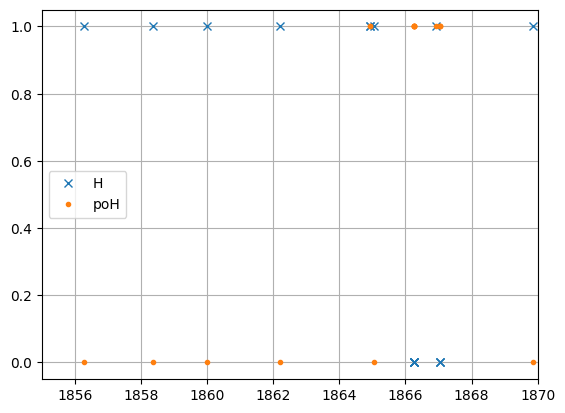

In [30]:
%matplotlib inline
import matplotlib.pyplot as plt
df_simple = df_prep_oh * 1
plt.plot(df_simple['Datum der Entscheidung'], df_simple['H'], 'x', label='H')
plt.plot(df_simple['Datum der Entscheidung'], df_simple['poH'], '.', label='poH')
plt.grid(True)
plt.xlim(1855, 1870)
plt.legend()
plt.show()

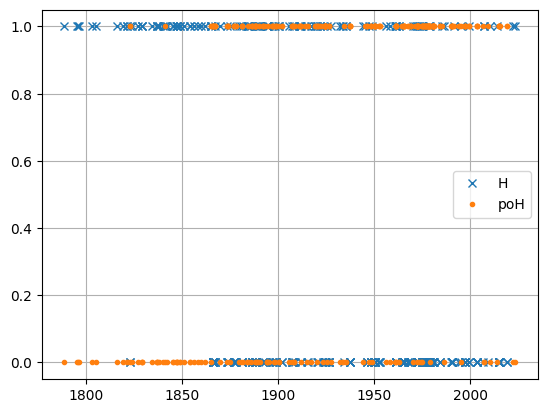

In [31]:
plt.plot(df_simple['Datum der Entscheidung'], df_simple['H'], 'x', label='H')
plt.plot(df_simple['Datum der Entscheidung'], df_simple['poH'], '.', label='poH')
plt.grid(True)
plt.legend()
plt.show()

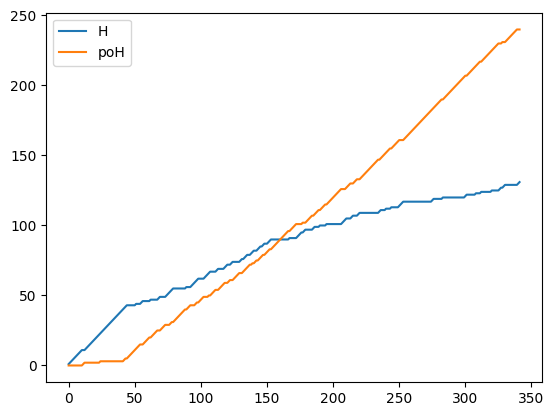

In [25]:
df_sorted = df.sort_values('Datum der Entscheidung')
plt.plot(np.arange(len(df_sorted)), np.cumsum(df_sorted['H'].to_numpy()), label='H')
plt.plot(np.arange(len(df_sorted)), np.cumsum(df_sorted['poH'].to_numpy()), label='poH')
plt.legend()
plt.show()

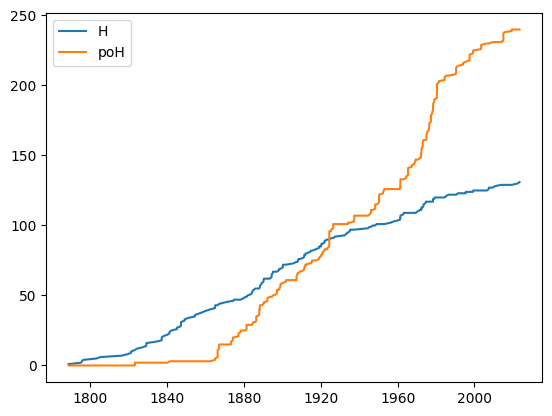

In [26]:
plt.plot(df_sorted['Datum der Entscheidung'], np.cumsum(df_sorted['H'].to_numpy()), label='H')
plt.plot(df_sorted['Datum der Entscheidung'], np.cumsum(df_sorted['poH'].to_numpy()), label='poH')
plt.legend()
plt.show()

In [ ]:
clf = CatBoost_TD_Classifier(val_metric_name='brier', n_cv=5

In [22]:
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_validate
import numpy as np

# df_simple = df_prep_oh.drop(columns='Datum der Entscheidung') * 1  # convert bools to int
df_simple = df_prep_oh * 1  # convert bools to int
df_simple = df_simple[df_simple['Datum der Entscheidung'] >= 1865.0].reset_index(drop=True)
# print(df_simple.head())
# print(f'{len(df_simple)=}')

for target_name in ['H', 'poH']:
    df_y = df_simple[target_name]
    df_x = df_simple.drop(columns=['H', 'poH'])

    clf = RandomForestClassifier()
    # clf = LogisticRegression(penalty='l1', solver='liblinear')
    # clf = LogisticRegression()
    # clf = HistGradientBoostingClassifier()
    print(target_name)
    print(f'Accuracy of constant classifier:', 0.5 + np.abs(np.mean(df_y) - 0.5))
    cv_result = cross_validate(clf, df_x, df_y, scoring=['accuracy', 'roc_auc'], cv=10)
    print('Accuracy of classifier:', np.mean(cv_result['test_accuracy']))
    print('ROC AUC of classifier:', np.mean(cv_result['test_roc_auc']))
    print()
    plot_permutation_importance_with_uncertainty(df_x, df_y, clf, cv=5)
    print('\n')

   Datum der Entscheidung  poH  H  Nebraska  New York  Connecticut  Illinois  \
0             1877.161644    1  0         0         0            0         0   
1             1911.367123    1  1         0         0            0         0   
2             1894.397260    0  1         0         0            0         0   
3             2022.424658    0  1         0         0            0         0   
4             1932.412568    0  1         0         0            0         0   

   Pennsylvania  Virginia  Ohio  ...  Teil des Urteils = S/D  \
0             0         0     0  ...                       0   
1             0         0     0  ...                       0   
2             0         0     0  ...                       0   
3             0         0     0  ...                       0   
4             0         0     0  ...                       0   

   Teil des Urteils = R/S  Teil des Urteils = M/S  Teil des Urteils = M/D  \
0                       0                       0        